In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.cluster import SpectralClustering
from sklearn.metrics.cluster import silhouette_score
from collections import Counter
from sklearn.decomposition import PCA
import umap
from sklearn.metrics.pairwise import cosine_similarity
import warnings
warnings.filterwarnings("ignore")

In [2]:
X_train = pd.read_csv('data/umist_cropped.csv')
X_train = X_train.to_numpy()

In [3]:
X_train_scaled = X_train/255

### PCA

In [4]:
pca = PCA(n_components=0.995, random_state=123)
X_train_pca = pca.fit_transform(X_train_scaled)

### Spectral_Precomputed

In [5]:
similarity_matrix = cosine_similarity(X_train_pca)
similarity_matrix += 1  # Shift to make all values non-negative
similarity_matrix = (similarity_matrix - similarity_matrix.min()) / (similarity_matrix.max() - similarity_matrix.min())
sil_score_pca_precomputed  = []

# Range of clusters to evaluate
cluster_range = range(10, 25)

# Compute silhouette scores for each number of clusters
for i in cluster_range:
    spectral = SpectralClustering(
        n_clusters=i,
        affinity='precomputed',  # Use precomputed similarity matrix
        assign_labels='kmeans',  # Use KMeans to assign final cluster labels
        random_state=42
    )
    # Fit the model on the similarity matrix
    spectral.fit(similarity_matrix)

    # Access cluster labels from the fitted model
    labels = spectral.labels_

    # Compute silhouette score and append it
    sil_score = silhouette_score(X_train_pca, labels)
    sil_score_pca_precomputed.append(sil_score)

best_clusters_pca_precomputed = cluster_range[np.argmax(sil_score_pca_precomputed)]
best_clusters_index_pca_precomputed = np.argmax(sil_score_pca_precomputed)


  File "c:\Users\joans\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "c:\Users\joans\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\joans\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "c:\Users\joans\anaconda3\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


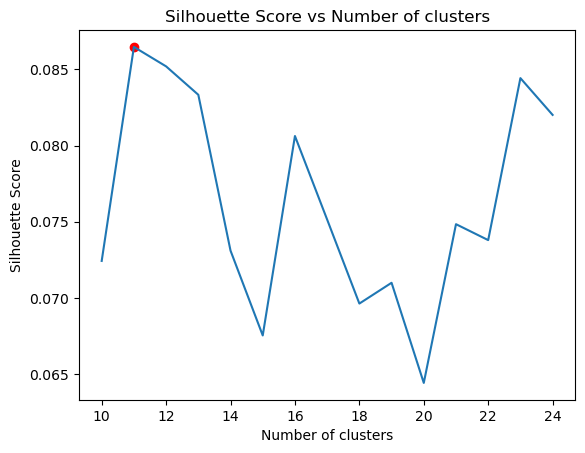

Best number of clusters: 11


In [6]:
plt.plot(cluster_range, sil_score_pca_precomputed)
plt.scatter(cluster_range[best_clusters_index_pca_precomputed], sil_score_pca_precomputed[best_clusters_index_pca_precomputed], color='red')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of clusters')
plt.show()

print(f'Best number of clusters: {best_clusters_pca_precomputed}')

### PCA + UMAP

In [7]:
pca= PCA(n_components=0.995, random_state=42)
pca.fit(X_train_scaled)
num_components = pca.n_components_

reducer = umap.UMAP(n_components = num_components, random_state =42)
X_train_umap = reducer.fit_transform(X_train_scaled)

### Spectral ( Precomputed)

In [8]:
similarity_matrix = cosine_similarity(X_train_umap)

sil_score_umap_precomputed  = []

# Range of clusters to evaluate
cluster_range = range(10, 25)

# Compute silhouette scores for each number of clusters
for i in cluster_range:
    spectral = SpectralClustering(
        n_clusters=i,
        affinity='precomputed',  # Use precomputed similarity matrix
        assign_labels='kmeans',  # Use KMeans to assign final cluster labels
        random_state=42
    )
    # Fit the model on the similarity matrix
    spectral.fit(similarity_matrix)

    # Access cluster labels from the fitted model
    labels = spectral.labels_

    # Compute silhouette score and append it
    sil_score = silhouette_score(X_train_umap, labels)
    sil_score_umap_precomputed.append(sil_score)

best_clusters_umap_precomputed = cluster_range[np.argmax(sil_score_umap_precomputed)]
best_clusters_index_umap_precomputed = np.argmax(sil_score_umap_precomputed)

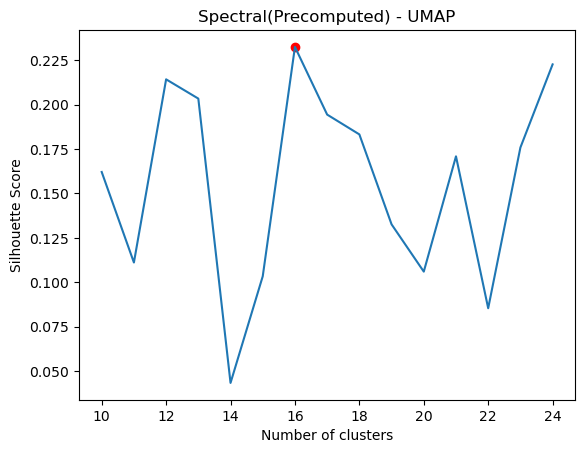

Best number of clusters: 16


In [9]:
plt.plot(cluster_range, sil_score_umap_precomputed)
plt.scatter(cluster_range[best_clusters_index_umap_precomputed], sil_score_umap_precomputed[best_clusters_index_umap_precomputed], color='red')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Spectral(Precomputed) - UMAP')
plt.show()

print(f'Best number of clusters: {best_clusters_umap_precomputed }')

### Spectral ( RBF)

In [10]:
sil_score_umap_rbf = []

# Range of clusters to evaluate
cluster_range = range(10, 25)

# Compute silhouette scores for each number of clusters
for i in cluster_range:
    spectral = SpectralClustering(
        n_clusters=i,
        affinity='rbf',  # Use precomputed similarity matrix
        assign_labels='kmeans',  # Use KMeans to assign final cluster labels
        random_state=42,
        
    )
    # Fit the model on the similarity matrix
    spectral.fit(X_train_umap)

    # Access cluster labels from the fitted model
    labels = spectral.labels_

    # Compute silhouette score and append it
    sil_score = silhouette_score(X_train_umap, labels)
    sil_score_umap_rbf.append(sil_score)

best_clusters_umap_rbf = cluster_range[np.argmax(sil_score_umap_rbf )]
best_clusters_index_umap_rbf = np.argmax(sil_score_umap_rbf )

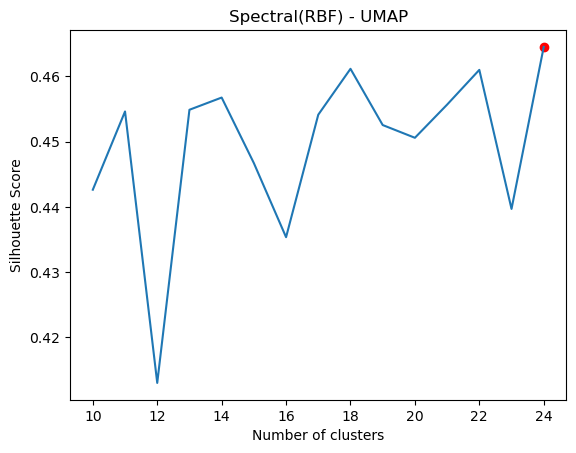

Best number of clusters: 24


In [11]:
plt.plot(cluster_range, sil_score_umap_rbf)
plt.scatter(cluster_range[best_clusters_index_umap_rbf], sil_score_umap_rbf[best_clusters_index_umap_rbf], color='red')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Spectral(RBF) - UMAP')
plt.show()

print(f'Best number of clusters: {best_clusters_umap_rbf }')

In [12]:
spectral = SpectralClustering(n_clusters=best_clusters_umap_rbf, affinity='rbf', assign_labels='kmeans',  random_state=42,)
spectral.fit(X_train_umap)
spectral_labels = spectral.labels_

### PLot in 2d

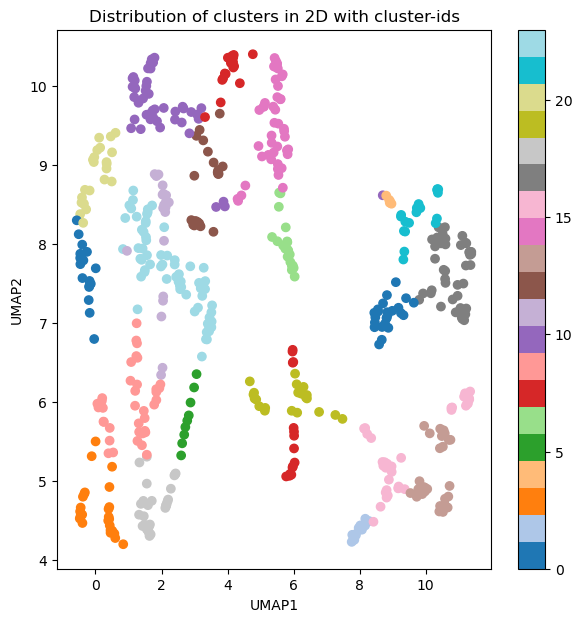

In [13]:
reducer = umap.UMAP(n_components = 2, random_state =42)
embeddings = reducer.fit_transform(X_train_scaled)


plt.figure(figsize=(7, 7))
plt.scatter(embeddings[:, 0], embeddings[:, 1], c=spectral_labels, cmap='tab20')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2') 
plt.title('Distribution of clusters in 2D with cluster-ids')
plt.colorbar()
plt.show()

In [14]:
print(f'Silhouette score: {silhouette_score(X_train_umap, spectral_labels)}')

Silhouette score: 0.46452948451042175


Counter({10: 46, 14: 46, 17: 44, 22: 43, 9: 37, 13: 32, 18: 29, 3: 28, 15: 26, 1: 25, 20: 24, 12: 24, 19: 21, 23: 21, 0: 20, 11: 20, 21: 20, 6: 20, 8: 17, 7: 16, 2: 14, 16: 13, 5: 9, 4: 5})


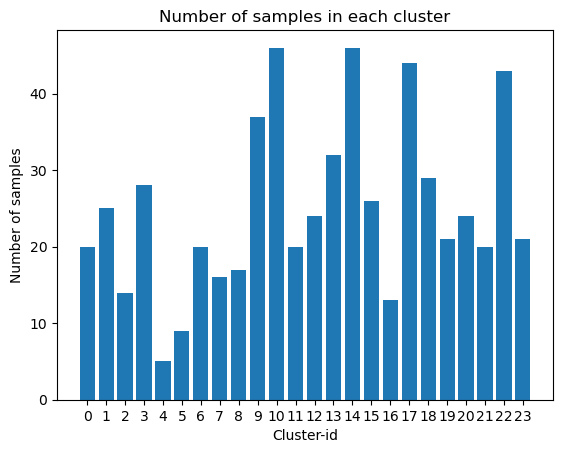

In [15]:
print(Counter(spectral_labels))

plt.bar(Counter(spectral_labels).keys(), Counter(spectral_labels).values())
plt.xlabel('Cluster-id')
plt.ylabel('Number of samples')
plt.title('Number of samples in each cluster')
plt.xticks(range(best_clusters_umap_rbf))
plt.show()

In [16]:
# Plot images of each cluster
umist_data = pd.read_csv("data/umist_cropped.csv")

umist_data['cluster_id'] = spectral_labels

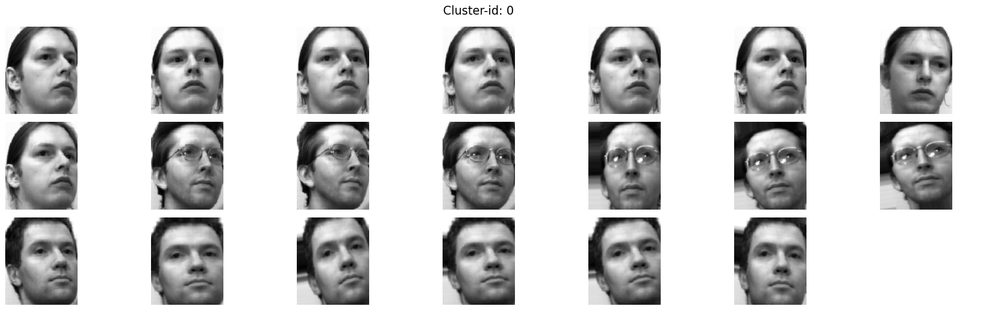

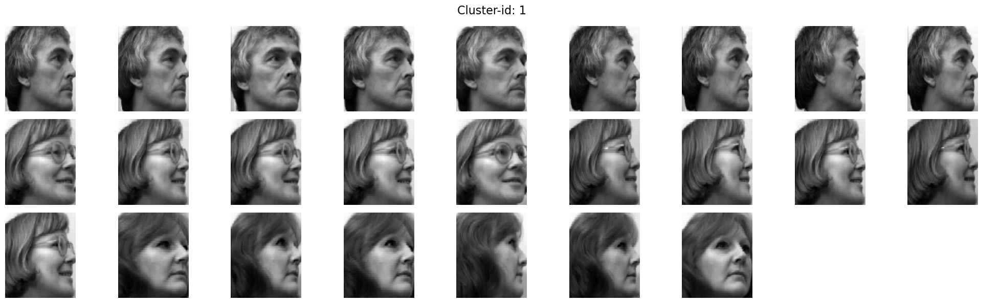

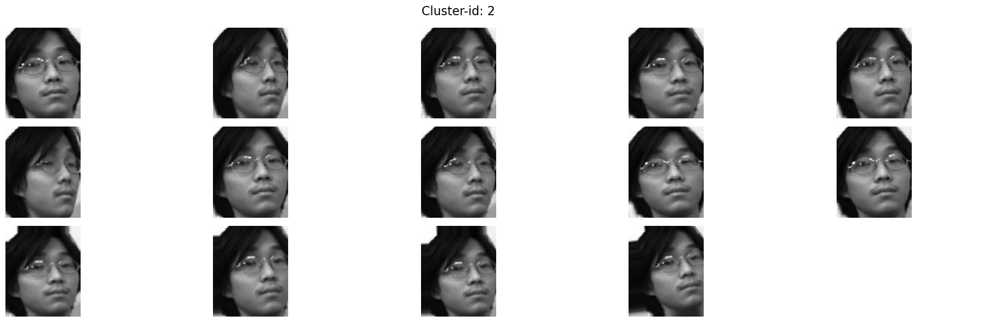

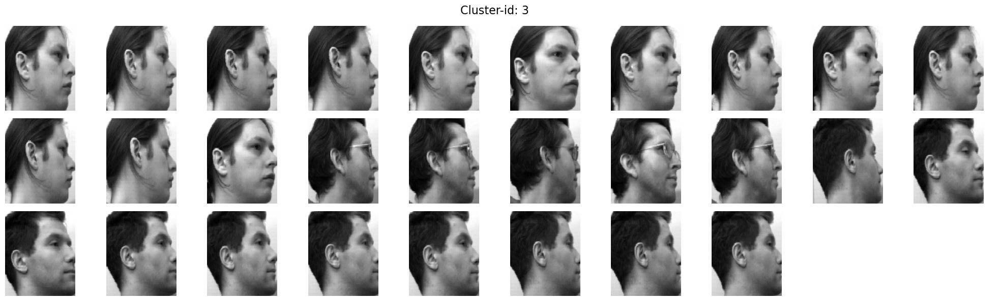

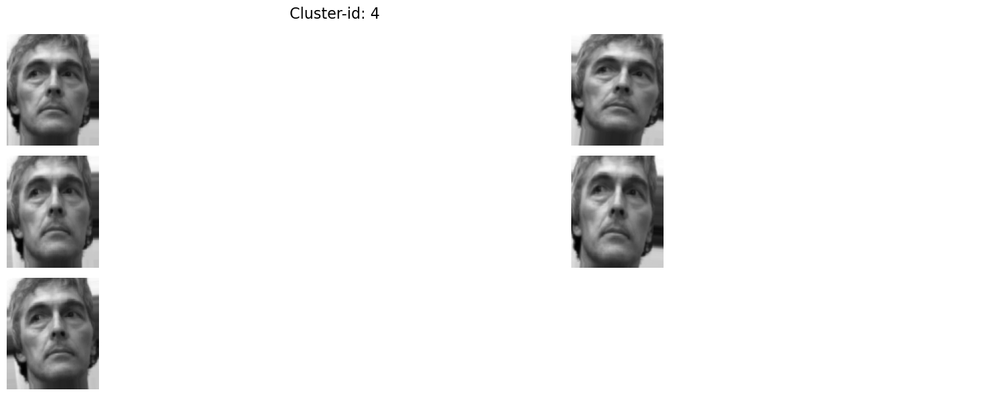

...

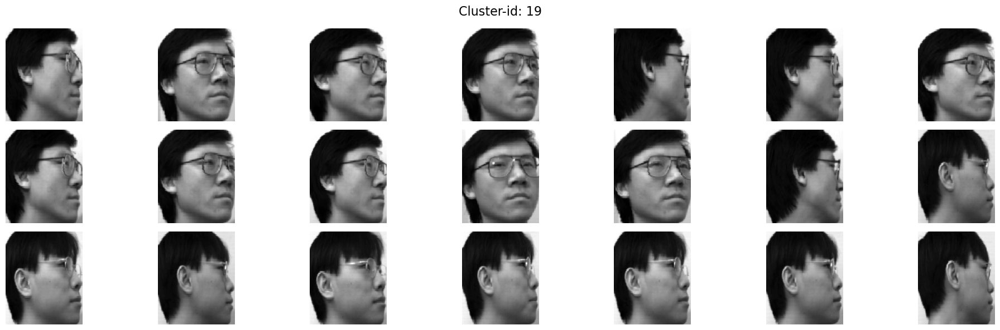

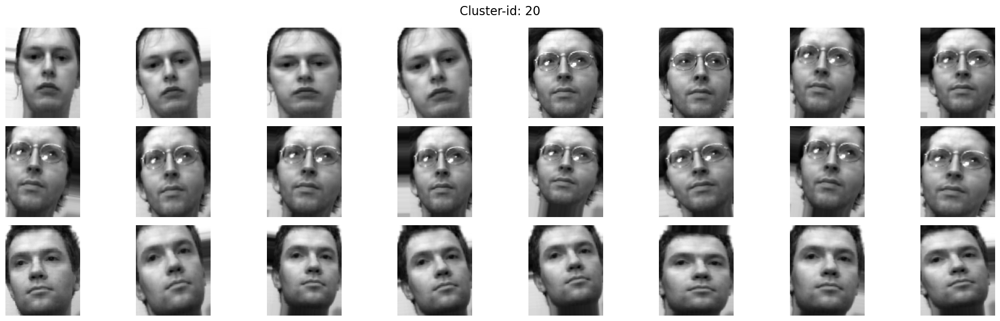

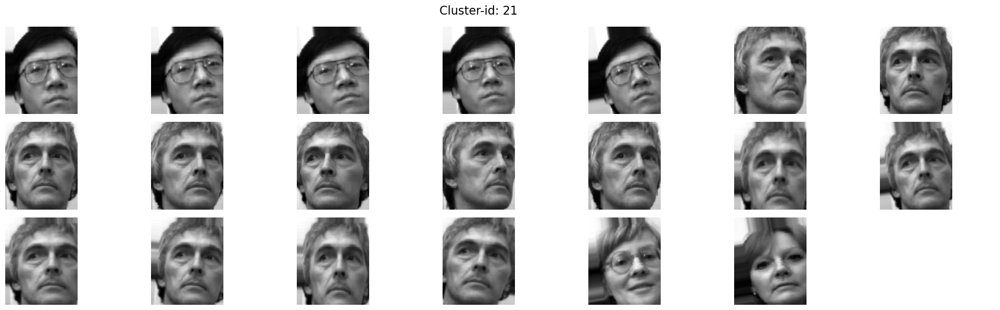

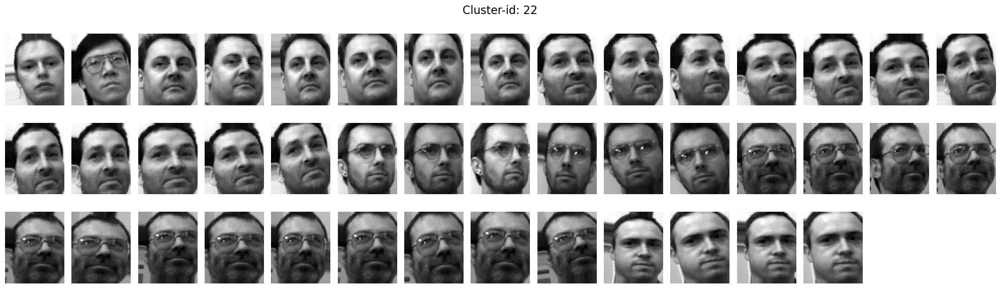

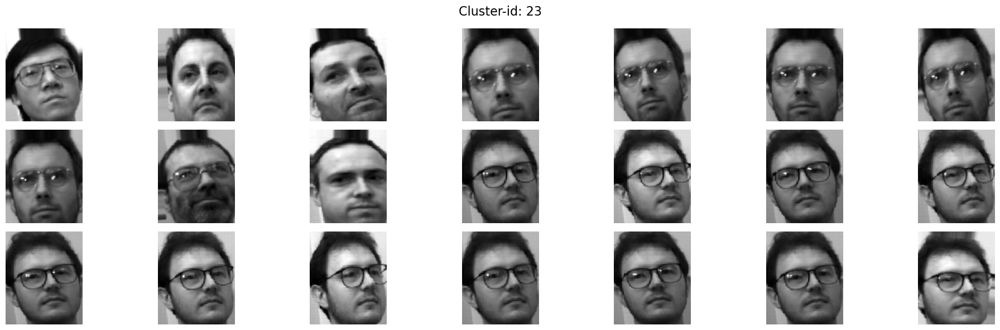

In [17]:
plt_range = None
if 0 not in Counter(labels).keys():
    plt_range = (1, best_clusters_umap_rbf + 1)
else:
    plt_range = (0, best_clusters_umap_rbf)

for cluster_id in range(plt_range[0], plt_range[1]):
    cluster_indices = umist_data[umist_data['cluster_id'] == cluster_id].index
    num_images = min(max(Counter(spectral_labels).values()), len(cluster_indices))
    
    if num_images > 0:
        # Define grid dimensions
        num_rows = 3
        num_cols = (num_images + num_rows - 1) // num_rows  # Ceiling division for columns
        
        fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 6))
        axes = axes.flatten()  # Flatten to handle indexing easily
        
        for i in range(num_rows * num_cols):
            if i < num_images:
                img_idx = cluster_indices[i]
                img = umist_data.iloc[img_idx, :-1].to_numpy().reshape(112, 92)
                
                axes[i].imshow(img, cmap='gray')
                axes[i].axis('off')
            else:
                # Hide unused subplots
                axes[i].axis('off')
        
        plt.suptitle(f'Cluster-id: {cluster_id}', fontsize=16)
        plt.tight_layout()
        plt.show()

In [18]:
# Plot the distribution of each cluster
original_data = pd.read_csv("data/umist_with_original_face_id.csv")

original_data['cluster_id'] = spectral_labels

original_labels = original_data['label']
clustered_labels = original_data['cluster_id']

unique_labels = np.unique(original_labels)
unique_clustered_labels = np.unique(clustered_labels)

original_labels = original_labels.to_numpy()
clustered_labels = clustered_labels.to_numpy()
def autopct_format(pct):
    return f'{pct:.1f}%' if pct >= 10 else ''

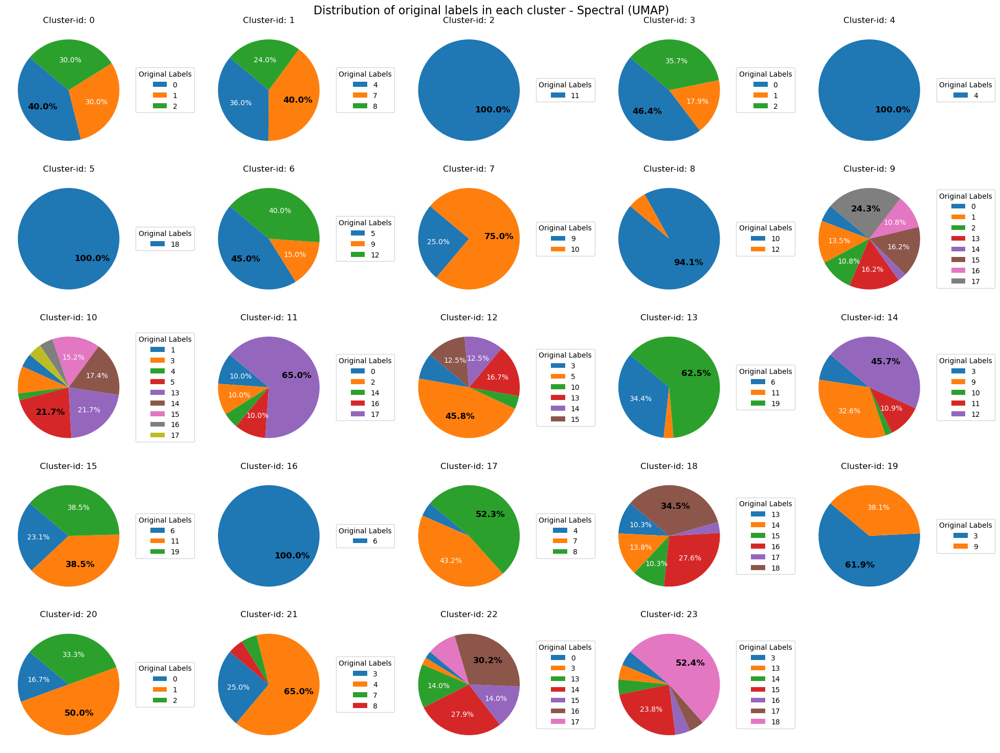

In [20]:
df = pd.DataFrame({'Original Labels': original_labels, 'Clustered Labels': clustered_labels})

num_clusters = len(unique_clustered_labels)
fig, axes = plt.subplots(5, 5, figsize=(20, 15), subplot_kw=dict(aspect="equal"))

axes = axes.flatten()

for i, cluster in enumerate(unique_clustered_labels):
    cluster_data = df[df['Clustered Labels'] == cluster]
    cluster_original_labels = cluster_data['Original Labels']
    
    cluster_original_labels_count = Counter(cluster_original_labels)
    labels = list(cluster_original_labels_count.keys())
    counts = list(cluster_original_labels_count.values())
    
    wedges, texts, autotexts = axes[i].pie(counts, labels=labels, autopct=lambda pct: autopct_format(pct), textprops=dict(color="w"), startangle=140)
    
    axes[i].legend(wedges, labels, title='Original Labels', loc='center left', bbox_to_anchor=(1, 0, 0.5, 1))
    
    largest_pct_idx = np.argmax(counts)
    autotexts[largest_pct_idx].set_color('black')
    autotexts[largest_pct_idx].set_fontsize(12)
    autotexts[largest_pct_idx].set_fontweight('bold')
        
    axes[i].set_title(f'Cluster-id: {cluster}')
        
    
for j in range(i + 1, len(axes)):
    axes[j].axis('off')
        
plt.suptitle('Distribution of original labels in each cluster - Spectral (UMAP)', fontsize=16)
plt.tight_layout()
plt.show()